In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import math as m
from numpy.random import randint, choice

# Session 1: Introduction

In [2]:
print("Hello, {}".format('Python Training'))

Hello, Python Training


In [3]:
m.pi

3.141592653589793

In [4]:
"Hello {:.4f}".format(m.pi)

'Hello 3.1416'

In [5]:
m.pow(2,0.5)

1.4142135623730951

## 1.0 Let us first start with a interesting visualization: the chaos game

Start from a vertex of equilateral triangle $v_0$, set it as the current point $p = v_i$ <br>
Repeat the following:
- Randomly choose a vertex call it $v_i$
- Take the mid-point of the current point and the chosed vertex $v_i$, save the point $p$
- Take the current point $p$ as $v_0$

In [6]:
choice(['A','B','C'])

'B'

In [7]:
SQRT_3 = m.sqrt(3)
trig_xs, trig_ys = [-1,1,0], [0,0,SQRT_3]

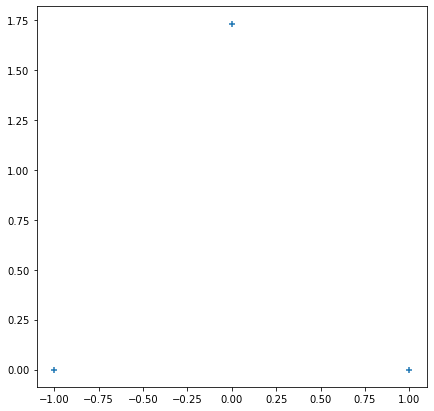

In [8]:
plt.figure(figsize=(7,7))
plt.scatter(trig_xs,trig_ys, marker='+')
plt.show()

## 1. The code for running the game:
The toolset you will gain
- Python for loops
- Assigning variables
- Lists, append to lists
- Using Randoms Packages
- Scatter Plots
- Basic animations

In [42]:
xss, yss, clrs = [], [], []
crt_x, crt_y = trig_xs[0], trig_ys[0]

for i in range(1,80000):
    randidx = randint(0,len(trig_xs))
    # randidx = choice(3,p=[0.49,0.02,0.49])
    vet_x, vet_y = trig_xs[randidx], trig_ys[randidx]
    crt_x, crt_y = (vet_x + crt_x)/2, (vet_y + crt_y)/2

    clrs.append(randidx)
    xss.append(crt_x)
    yss.append(crt_y)

In [10]:
from matplotlib.animation import FuncAnimation

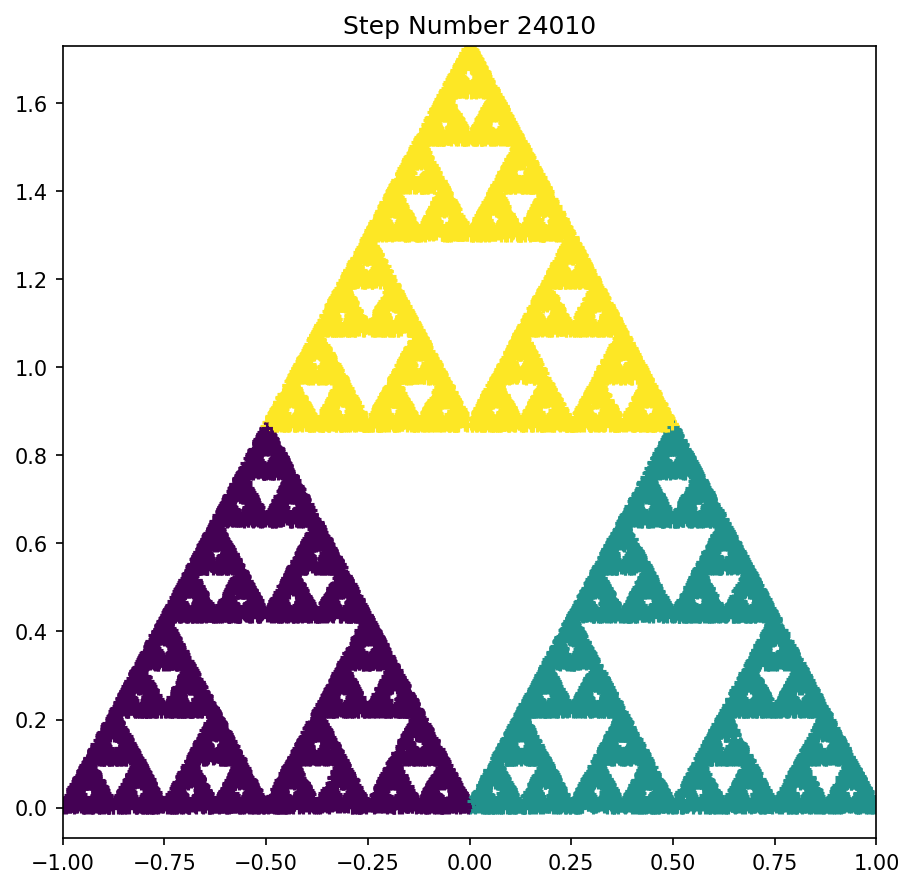

In [11]:
plt.rcParams["animation.html"] = "jshtml" ## The format to output the animation
plt.rcParams['figure.dpi'] = 150 ## The resolution of the animation
plt.ioff()
fig, ax = plt.subplots(figsize=(7,7))

def grw_func(t): # Function dictating how the animation time frame grow
    if t < 70:
        return t
    elif t < 130:
        return 30*(t-70) + 70
    else:
        return 30*pow(t-130,3)+30*(t-70) + 70

def animate(t): # Function for static animation of the chaos game
    plt.cla()
    until_num = grw_func(t)
    ax.scatter(x=xss[:until_num],y=yss[:until_num],c=clrs[:until_num],marker='+') ## Plot the points up to until_num as a "x"
    ax.set_title('Step Number {}'.format(until_num))
    ax.set_xlim(-1,1)
    ax.set_ylim(-0.07,1.73)

FuncAnimation(fig, animate, frames=140)

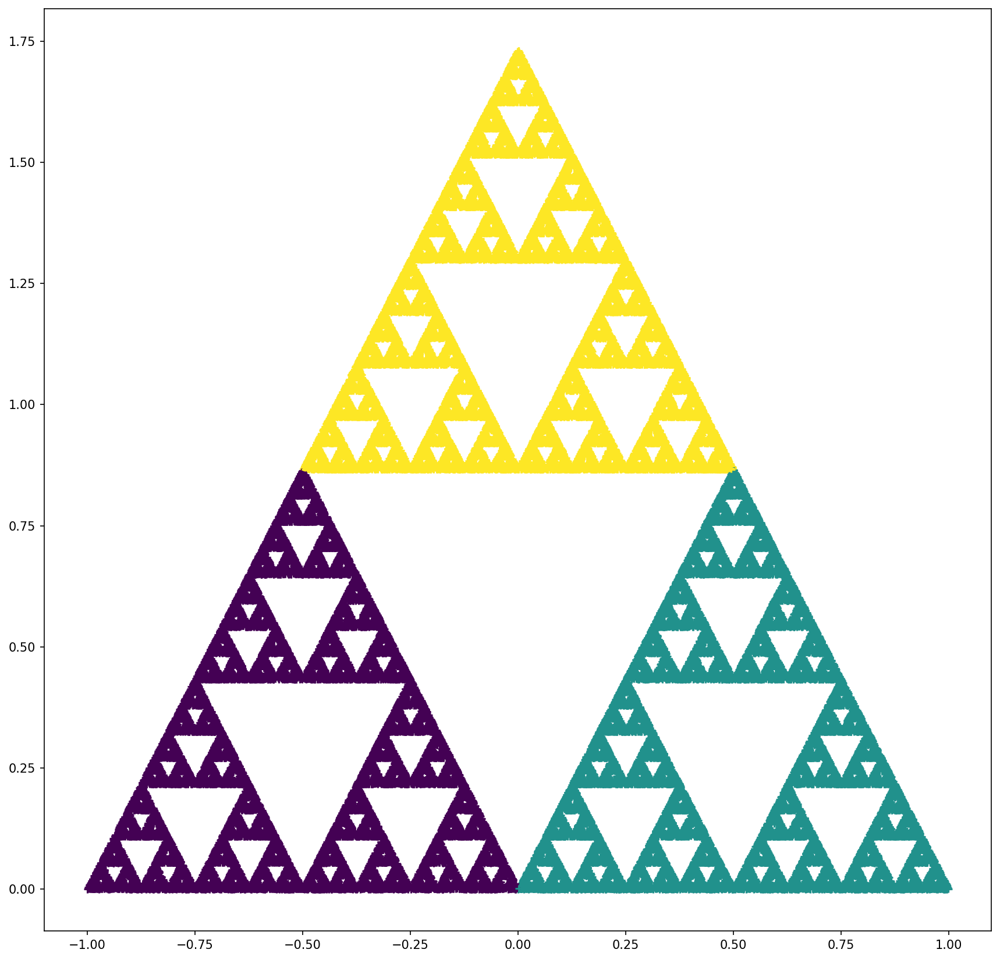

In [12]:
plt.figure(figsize=(14,14))
plt.scatter(xss,yss, c=clrs, marker='+')
plt.show()

In [13]:
n = 0 
while (n < 9):
    print(n)
    n += 1

0
1
2
3
4
5
6
7
8


## Exercise 2: Restricted Chaos game in a square (5 mins)
Now that we have seen that we can produce a fractal using chaos game in a Triangle, we shall then try to produce a chaos game in a square.
However, if we only use the rule we have earlier, the scatter plot will typically fill up the entire square, leaving a meaningless and indeed quite messy pattern. However, if we we add more restrictions to rule of the generation. Some interesting patterns can emerge.

For example, let use use the spirit of the game in triangle. But in this case, discard the vertex chosen if the vertex chosen is adjacent to the last vertex used in last iteration. You can reuse the code we used in the generation of serpenski triangles.

- While loops

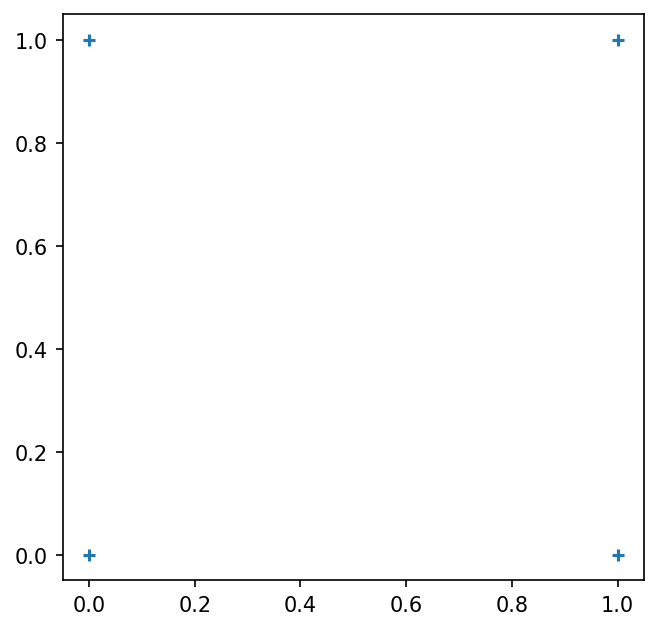

In [14]:
# SQRT_3 = m.sqrt(3)
sq_xs, sq_ys = [0,1,1,0], [1,1,0,0]

plt.figure(figsize=(5,5))
plt.scatter(sq_xs,sq_ys, marker='+')
plt.show()

In [15]:
randint(11)

10

In [16]:
xss, yss, clrs = [], [], []
crt_x, crt_y = sq_xs[0], sq_ys[0]

last_idx, this_idx = 0, 0
for i in range(1,80000):
    # randidx = choice(3,p=[0.49,0.02,0.49])
    this_idx = randint(0,len(sq_xs))
    
    while np.abs(this_idx - last_idx) == 2:
        # print(this_idx)
        this_idx = randint(0,len(sq_xs))

    vet_x, vet_y = sq_xs[this_idx], sq_ys[this_idx]
    crt_x, crt_y = (vet_x + crt_x)/2, (vet_y + crt_y)/2
    last_idx = this_idx
    clrs.append(this_idx)
    xss.append(crt_x)
    yss.append(crt_y)

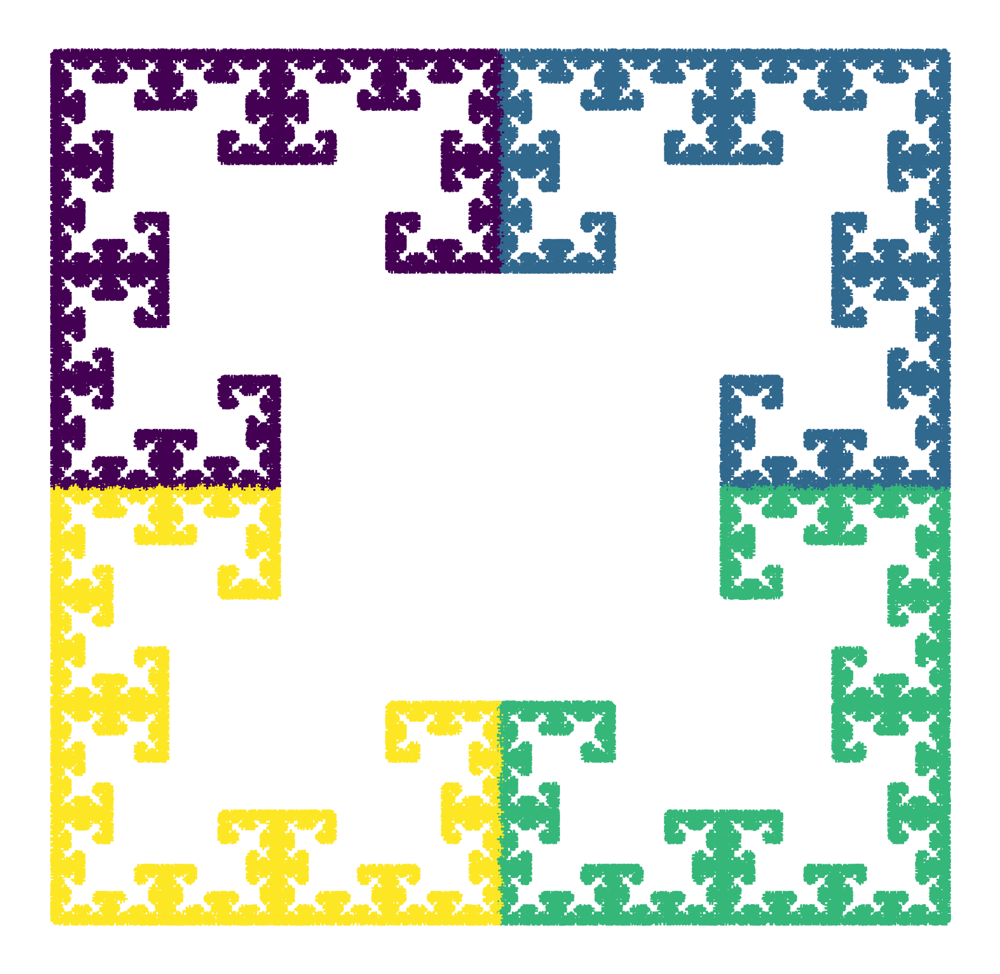

In [41]:
plt.figure(figsize=(14,14))
plt.scatter(xss, yss, c=clrs, marker='+')
plt.axis('off')
plt.show()

## 2 Data Processing in data frames basic
# 2.0 Let us turn the data we generated into a data frame

- Creating dataframes
- Basic dataframe Statistics

In [18]:
dict_i = {
    0:'Python',
    1:'course'
}

In [19]:
dict_i[0]

'Python'

In [43]:
dfserp = pd.DataFrame({'xcorr':xss, 'ycorr':yss,'colors':clrs}) # There are many 
dfserp.head(10)

,xcorr,ycorr,colors
0,0.000000,0.000000,1
1,0.500000,0.000000,1
2,0.250000,0.866025,2
3,0.625000,0.433013,1
4,0.812500,0.216506,1
5,0.906250,0.108253,1
6,0.953125,0.054127,1
7,-0.023438,0.027063,0
8,-0.511719,0.013532,0
9,-0.255859,0.872791,2


In [44]:
dfserp

,xcorr,ycorr,colors
0,0.000000,0.000000,1
1,0.500000,0.000000,1
2,0.250000,0.866025,2
3,0.625000,0.433013,1
4,0.812500,0.216506,1
...,...,...,...
79994,0.333460,1.100195,2
79995,0.166730,1.416123,2
79996,0.583365,0.708061,1
79997,0.791682,0.354031,1


### 2.1 Dataframe dumping and loading

In [45]:
dfserp.to_csv("serp.csv", index=False)

In [46]:
pd.read_csv('serp.csv')

,xcorr,ycorr,colors
0,0.000000,0.000000,1
1,0.500000,0.000000,1
2,0.250000,0.866025,2
3,0.625000,0.433013,1
4,0.812500,0.216506,1
...,...,...,...
79994,0.333460,1.100195,2
79995,0.166730,1.416123,2
79996,0.583365,0.708061,1
79997,0.791682,0.354031,1


### 2.2 View Dataframe Basic Statistics

In [47]:
dfserp.describe()

,xcorr,ycorr,colors
count,79999.000000,79999.000000,79999.000000
mean,0.004439,0.575371,1.000513
std,0.471701,0.471634,0.814788
min,-0.997758,0.000000,0.000000
25%,-0.357727,0.137929,0.000000
50%,0.014086,0.466896,1.000000
75%,0.364645,0.935336,2.000000
max,0.999315,1.731331,2.000000


In [48]:
dfserp.dtypes

xcorr     float64
ycorr     float64
colors      int64
dtype: object

In [49]:
dfserp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79999 entries, 0 to 79998
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   xcorr   79999 non-null  float64
 1   ycorr   79999 non-null  float64
 2   colors  79999 non-null  int64  
dtypes: float64(2), int64(1)
memory usage: 1.8 MB


In [50]:
dfserp.max()

xcorr     0.999315
ycorr     1.731331
colors    2.000000
dtype: float64

## 2.3 Subsetting using coordinates and orientation
- python functions
- Recursion
- Dataframe Subsetting in Pandas

In [51]:
dfserp['ycorr'] > SQRT_3/2.0

0        False
1        False
2        False
3        False
4        False
         ...  
79994     True
79995     True
79996    False
79997    False
79998    False
Name: ycorr, Length: 79999, dtype: bool

In [52]:
dfserp[
    dfserp['ycorr'] > SQRT_3/2.0
]

,xcorr,ycorr,colors
9,-0.255859,0.872791,2
10,-0.127930,1.302421,2
12,0.218018,1.191631,2
19,0.353266,0.875335,2
20,0.176633,1.303693,2
...,...,...,...
79986,0.365707,1.057603,2
79988,0.341427,1.130426,2
79992,0.333839,0.936677,2
79994,0.333460,1.100195,2


In [53]:
# upc

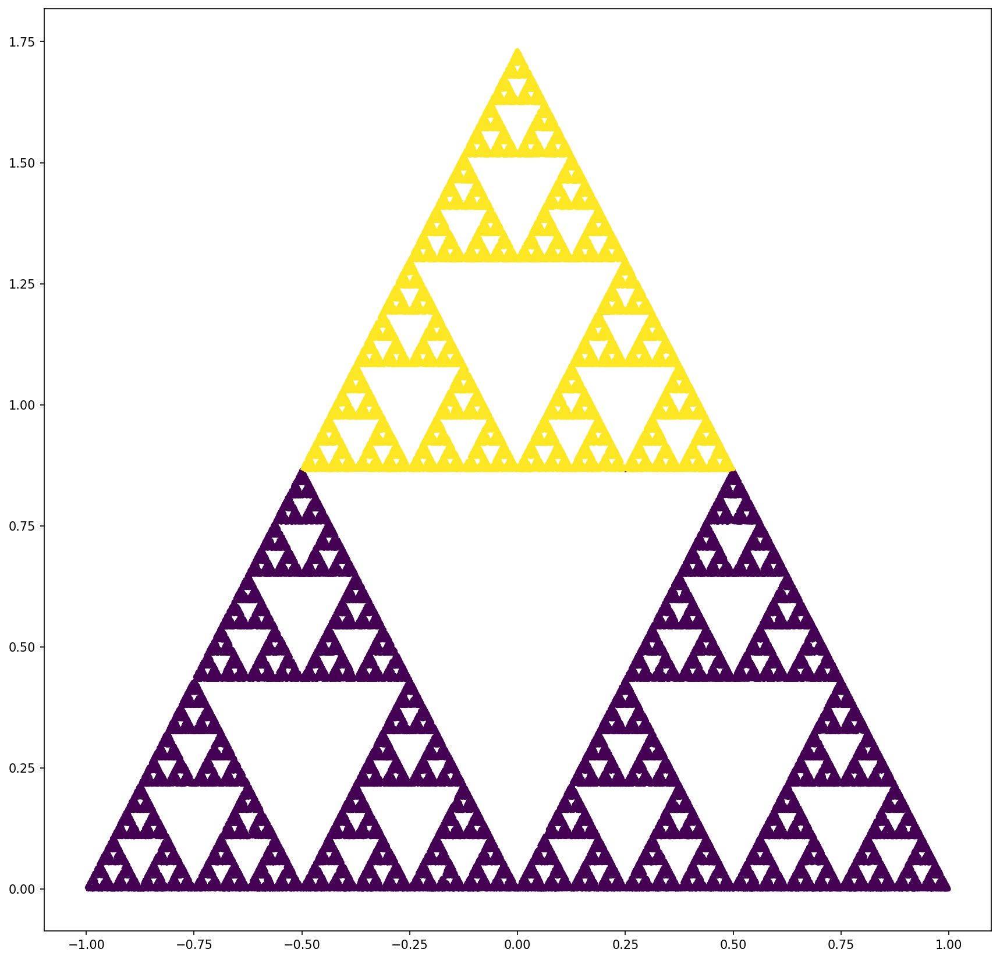

In [54]:
upc = dfserp['ycorr'] > SQRT_3/2.0
# dfserp.apply(lambda rw: rw['ycorr'] > SQRT_3/2.0, axis=1)

plt.figure(figsize=(14,14))
plt.scatter(dfserp['xcorr'],dfserp['ycorr'], marker='.',c=upc)
plt.show()

In [55]:
## Basic Recursion Implementing Factoriols
# i = 3
def rec_factor(i):
    if i == 1:
        return i
    else:
        return (i)*rec_factor(i-1)

In [56]:
rec_factor(3)

6

In [57]:
rgb_cyc = {
    'r':['r','g','b'],
    'g':['g','b','r'],
    'b':['b','r','g']
}

PI_2_3 = np.deg2rad(120)

In [58]:
def assign_col(dflast, x_min, x_max, y_min, y_max, starter, rec_depth):
    thresx = (x_min+x_max)/2
    thresy = y_min + (y_max-y_min)/2
    clrs = rgb_cyc[starter]
    if rec_depth > 0:
        assign_col(dflast,x_min=x_min,x_max=x_max,y_min=thresy, y_max=y_max,starter=clrs[0], rec_depth=rec_depth-1)
        assign_col(dflast,x_min=x_min,x_max=thresx,y_min=y_min, y_max=thresy,starter=clrs[1], rec_depth=rec_depth-1)
        assign_col(dflast,x_min=thresx,x_max=x_max,y_min=y_min, y_max=thresy,starter=clrs[2], rec_depth=rec_depth-1)
        return 
    else:
        dflast.loc[
            dflast['xcorr'].between(x_min, x_max, inclusive=True) & dflast['ycorr'].between(y_min, y_max, inclusive=True), 
            'clr_{}'.format(rec_depth)
            ] = starter
        # print(dflast)
        return 


In [59]:
rec_depth = 5
# dfserp['clr_{}'.format(rec_depth)] = np.nan
x_min, x_max = dfserp['xcorr'].min(), dfserp['xcorr'].max()
y_min, y_max = dfserp['ycorr'].min(), dfserp['ycorr'].max()

assign_col(dfserp, x_min=x_min,x_max=x_max,y_min=y_min,y_max=y_max,starter='r',rec_depth=rec_depth)

/var/folders/m8/cjs7j0v57hz7zynm5s9ds69w0000gn/T/ipykernel_49789/1211704504.py:12: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  dflast['xcorr'].between(x_min, x_max, inclusive=True) & dflast['ycorr'].between(y_min, y_max, inclusive=True),


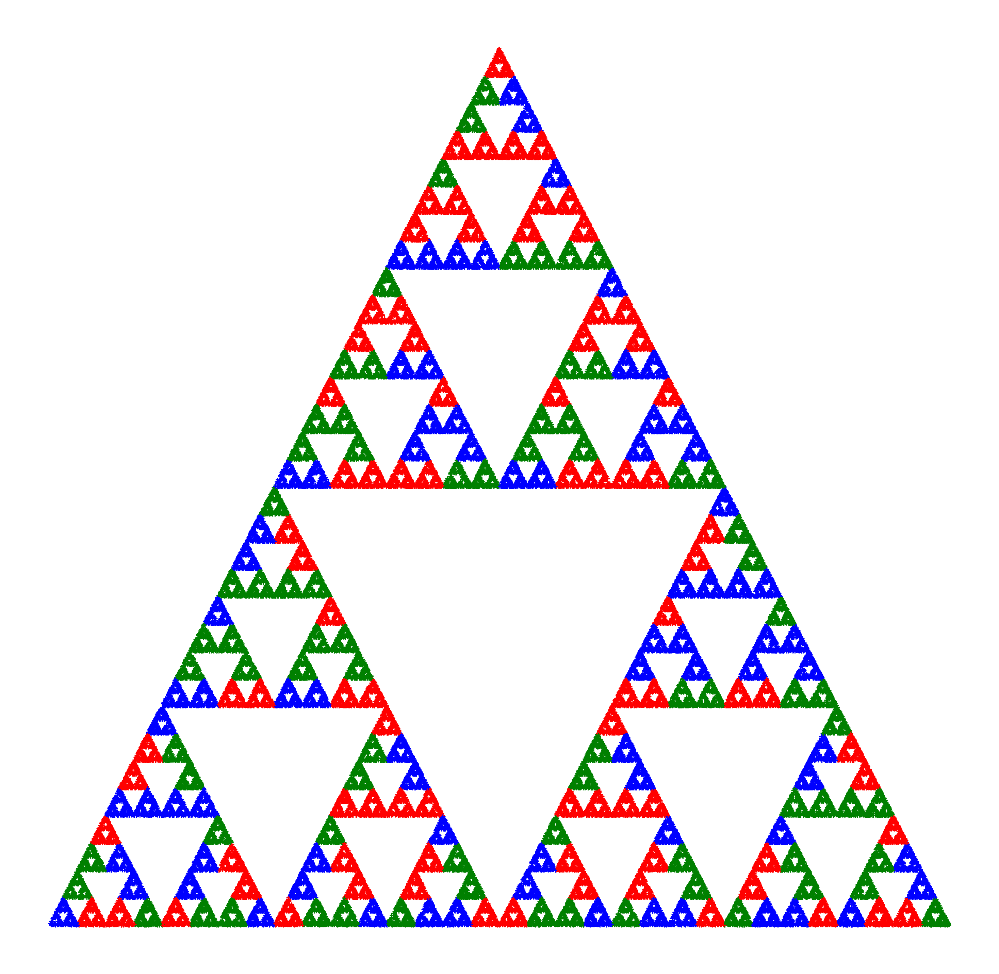

In [61]:
plt.figure(figsize=(25,25))
plt.scatter(dfserp['xcorr'],dfserp['ycorr'], marker='+',c=dfserp['clr_0'])
plt.axis('off')
plt.show()

## Exercise 2: Draw Barnley's Fern
Choose one linear transformation from four linear transformations, with weighted probability. <br>
And used the transformation to perform another chaos game, by iterating the point using the random linear transformation

In [65]:
def generate_lineartransformation(a1,b1,c1,a2,b2,c2):
    def theF(x, y):
        # print(c2)
        return a1*x+b1*y+c1, a2*x+b2*y+c2
    return theF

f1 = generate_lineartransformation(.0,.0,.0,.0,0.16,.0)
f2 = generate_lineartransformation(.85,.04,.0,-.04,.85,1.6)
f3 = generate_lineartransformation(.20,-.26,.0,.23,.22,1.6)
f4 = generate_lineartransformation(-.15,.28,.0,.26,.24,.44)

f_idices = [0,1,2,3]
flst = [f1,f2,f3,f4]
prob = [.01,.85,.07,.07]

In [79]:
2e4

20000.0

In [80]:
thisx, thisy = .0,.0
xlst, ylst, clrs = [], [], []
for i in range(20000):
    xlst.append(thisx)
    ylst.append(thisy)
    chosedidx = choice(f_idices, p=prob)
    clrs.append(chosedidx)
    chosedf = flst[chosedidx]
    thisx, thisy = chosedf(thisx,thisy)


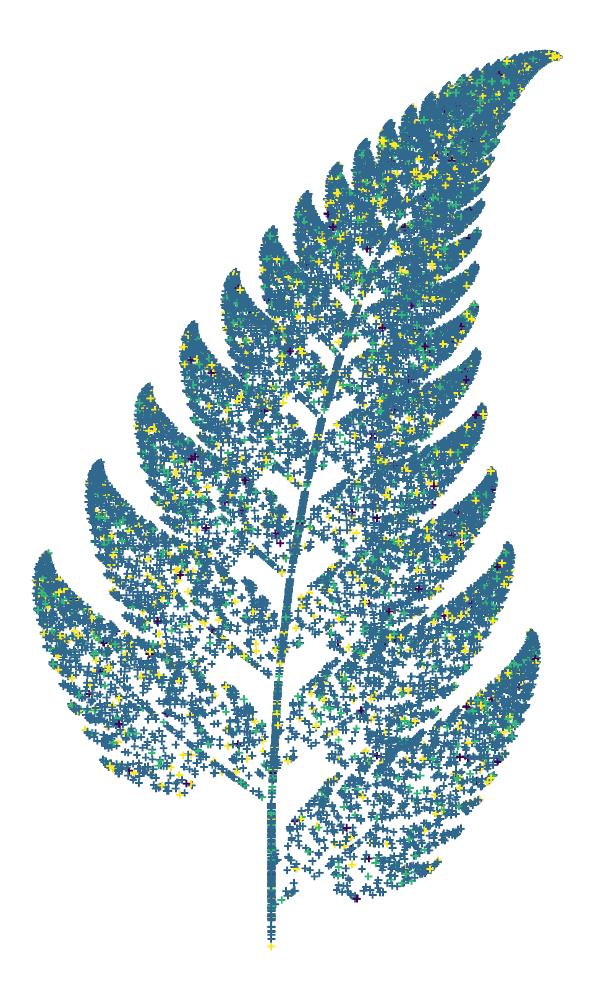

In [81]:
plt.figure(figsize=(8,14))
plt.scatter(x=xlst,y=ylst,marker='+', c=clrs)
plt.axis("off")
plt.show()